# <center> Noise

In [1]:
import numpy as np
import pandas as pd
import time
import os
import sys
import pickle
from datetime import datetime

In [2]:
sys.path.append(os.path.dirname(os.path.dirname(os.getcwd())))
sys.path.append(os.path.dirname(os.getcwd()))
from ams_jetcis.scripts import sensor_script_example as scripts
import characterization.stats_engine.stats as stats
import characterization.emva.emva as emva
import ams_jetcis.scripts.plotter as plotter

# Get image data

In [3]:
grab_im = 0

if grab_im:
    #Grab images + save to pickle
    sensor = scripts.select_sensor('Mira220', 0)
    sensor.cold_start()
    sensor.init_sensor()
    sensor.exposure_us = sensor.lines_to_time(1)

    imgs = sensor.imager.grab_images(50)

    with open('/home/jetcis/svn/software/trunk/sw/ams_jetcis/notebooks/imgs_noise.pkl', 'wb') as f:
        pickle.dump(imgs, f)

else:
    #Load images from pickle
    with open('/home/jetcis/svn/software/trunk/sw/ams_jetcis/notebooks/imgs_noise.pkl', 'rb') as f:
        imgs = pickle.load(f)

In [4]:
imgs.shape

(50, 1400, 1600)

# Noise stats

In [5]:
noise_stats = stats.agg_results(imgs)
df = pd.DataFrame([emva.dsnu1288_stack(imgs)])
for cc in df.columns:
    col_name = cc + '_DN'
    df.rename(columns={cc: col_name}, inplace=True)
df.rename(columns=emva.ut.summ_col_rename(), inplace=True)
df = df[["Total DSNU [DN]", "Pix DSNU [DN]", "Col DSNU [DN]", "Row DSNU [DN]"]]
noise_stats = noise_stats.join(df)
display(noise_stats)

,Mean [DN],Total FPN [DN],Pix FPN [DN],Col FPN [DN],Row FPN [DN],Total Temp Noise [DN],Pix Temp Noise [DN],Col Temp Noise [DN],Row Temp Noise [DN],Total DSNU [DN],Pix DSNU [DN],Col DSNU [DN],Row DSNU [DN]
0,208.606,2.298,2.092,0.474,0.825,2.425,2.31,0.443,0.591,2.180322,2.12253,0.379255,0.328118


# Plot results

In [6]:
avg_im = stats.avg_img_stack(imgs)
std_im = np.sqrt(stats.tot_var_img_stack(imgs))

In [7]:
plotter.profile(stats.noise_profile(imgs, axis='row'),
                axis='Row', quantity='noise', unit='DN')

In [8]:
plotter.profile(stats.noise_profile(imgs, axis='column'),
                axis='Column', quantity='noise', unit='DN')

In [9]:
plotter.profile(stats.fpn_profile(imgs, axis='row'),
                axis='Row', quantity='FPN', unit='DN')

In [10]:
plotter.profile(stats.fpn_profile(imgs, axis='column'),
                axis='Column', quantity='FPN', unit='DN')

In [11]:
hist_tdn = emva.histogram1288(std_im, 256, imgs.shape[0], black_level=True)

plotter.histogram(std_im, hist_tdn, 
                  title='temporal dark noise', 
                  unit='DN', 
                  nb_limit_std=10)

plotter.accumulated_histogram(std_im, hist_tdn, 
                              title='temporal dark noise', 
                              unit='DN', 
                              nb_limit_std=10)

In [12]:
hist_dsnu = emva.histogram1288(avg_im, 256, imgs.shape[0], black_level=True)

plotter.histogram(avg_im, hist_dsnu, 
                  title='DSNU', 
                  unit='DN',  
                  nb_limit_std=10)

plotter.accumulated_histogram(avg_im, hist_dsnu, 
                              title='DSNU', 
                              unit='DN',  
                              nb_limit_std=10)


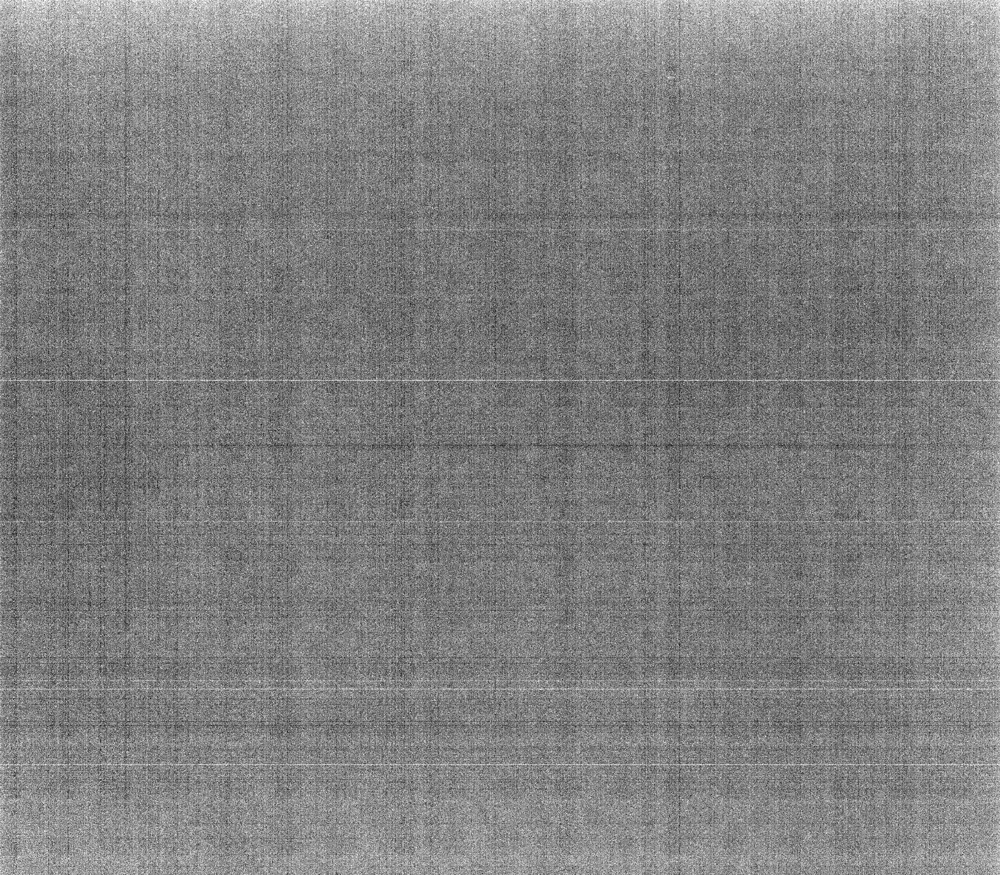

In [13]:
plotter.rowcolumn(avg_im,
                  np.max([0, (np.median(avg_im) - 3 * np.std(avg_im))]), 
                  np.median(avg_im) + 3 * np.std(avg_im),
                  title='DSNU')

In [14]:
plotter.spectrogram(emva.spectrogram(avg_im), 
                    noise_stats['Total DSNU [DN]'][0], 
                    'DSNU')

In [15]:
plotter.multi_profile(stats.profile(avg_im, horizontal=True),
                      param = 'DSNU',
                      orientation = 'Horizontal')
plotter.multi_profile(stats.profile(avg_im, horizontal=False),
                      param = 'DSNU',
                      orientation = 'Vertical')

# Save data

In [16]:
%%javascript
IPython.notebook.save_notebook()

<IPython.core.display.Javascript object>

In [17]:
notebook_name = 'plotter_noise' #Write here the correct notebook name


path = os.getcwd() + '/'
if os.path.exists(f'{path + notebook_name}.ipynb'):
    filename = notebook_name + datetime.now().strftime('_%m-%d-%Y_%H%M%S')
    !jupyter nbconvert --to html {notebook_name}.ipynb --output {path + filename}.html
else: 
    print('Please provide the correct notebook name!')

[NbConvertApp] Converting notebook plotter_noise.ipynb to html
[NbConvertApp] Writing 7327549 bytes to /home/jetcis/svn/software/trunk/sw/ams_jetcis/notebooks/plotter_noise_01-13-2022_161235.html
